RUN GPU COLAB

In [1]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


# Descargando un dataset de kaggle

* Debemos ir a nuestra cuenta de kaggle / setting, generamos un Api token y es el json que nos pide subir
* Despues descargamos el dataset y lo descomprimimos en la carpeta train



In [2]:
!pip install kaggle

In [3]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"jonnatanariasgarcia","key":"49b5a2f1ee06c09d327c73e7118b49ae"}'}

In [4]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
! kaggle datasets list

ref                                                  title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
rahulvyasm/netflix-movies-and-tv-shows               Netflix Movies and TV Shows                      1MB  2024-04-10 09:48:38           5118        106  1.0              
sahirmaharajj/youth-tobacco-survey                   Youth Tobacco Dataset (2 Decades)              264KB  2024-04-11 20:19:31           1048         23  1.0              
mexwell/heart-disease-dataset                        🫀 Heart Disease Dataset                        399KB  2024-04-08 09:43:49           2724         47  1.0              
prishasawhney/mushroom-dataset                       Mushroom Dataset (Binary Classification)       602KB  2024-04-18 19:56:44           101

Descargamos dataset, en este caso coco car damage

In [7]:
! kaggle datasets download -d lplenka/coco-car-damage-detection-dataset

 35% 5.00M/14.4M [00:00<00:00, 43.1MB/s]
100% 14.4M/14.4M [00:00<00:00, 88.7MB/s]


Extraemos el zip en la carpeta train

In [8]:
! mkdir train

In [9]:
! unzip coco-car-damage-detection-dataset.zip -d train

Archive:  coco-car-damage-detection-dataset.zip
  inflating: train/img/1.jpg         
  inflating: train/img/10.jpg        
  inflating: train/img/13.jpg        
  inflating: train/img/14.jpg        
  inflating: train/img/15.jpg        
  inflating: train/img/16.jpg        
  inflating: train/img/17.jpg        
  inflating: train/img/18.jpg        
  inflating: train/img/19.jpg        
  inflating: train/img/2.jpg         
  inflating: train/img/20.jpg        
  inflating: train/img/21.jpg        
  inflating: train/img/22.jpg        
  inflating: train/img/23.jpg        
  inflating: train/img/24.jpg        
  inflating: train/img/25.jpg        
  inflating: train/img/26.jpg        
  inflating: train/img/27.jpg        
  inflating: train/img/29.jpg        
  inflating: train/img/3.jpg         
  inflating: train/img/30.jpg        
  inflating: train/img/31.jpg        
  inflating: train/img/32.jpg        
  inflating: train/img/33.jpg        
  inflating: train/img/34.jpg        
  

# Libreria DETECTRON2 by Facebook (meta)

In [10]:
!pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-4tt1tw4c
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-4tt1tw4c
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=375618 sha256=ff32ddd9967f0eecff59e3851e9348f3e01c2b5932a1146be6b3428ffca80175
  Stored in directory: /tmp/pip-ephem-wheel-cache-pjoyqfkg/wheels/39/61/b4/480fbddb4d3d6bc34083e7397bc6f5d1381f79acc68e9f3511
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.7
    Uninstalling pycocotools-2.0.7:
      Successfully uninstalled pycocotools-2.0.7


## Utils

In [11]:
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import random
pylab.rcParams['figure.figsize'] = (8.0, 10.0)# Import Libraries

# For visualization
import os
import seaborn as sns
from matplotlib import colors
from tensorboard.backend.event_processing import event_accumulator as ea
from PIL import Image

## Data

In [13]:
%ls /content/train/img

10.jpg  18.jpg  23.jpg  2.jpg   36.jpg  41.jpg  48.jpg  53.jpg  59.jpg  68.jpg  74.jpg  7.jpg
13.jpg  19.jpg  24.jpg  30.jpg  37.jpg  42.jpg  49.jpg  54.jpg  5.jpg   69.jpg  75.jpg  80.jpg
14.jpg  1.jpg   25.jpg  31.jpg  38.jpg  43.jpg  4.jpg   55.jpg  61.jpg  6.jpg   76.jpg  8.jpg
15.jpg  20.jpg  26.jpg  32.jpg  39.jpg  44.jpg  50.jpg  56.jpg  62.jpg  70.jpg  77.jpg  9.jpg
16.jpg  21.jpg  27.jpg  33.jpg  3.jpg   46.jpg  51.jpg  57.jpg  63.jpg  71.jpg  78.jpg
17.jpg  22.jpg  29.jpg  34.jpg  40.jpg  47.jpg  52.jpg  58.jpg  64.jpg  73.jpg  79.jpg


In [14]:
# I am visualizing some images in the 'val/' directory

dataDir='/content/train/val'
dataType='COCO_val_annos'
mul_dataType='COCO_mul_val_annos'
annFile='{}/{}.json'.format(dataDir,dataType)
mul_annFile='{}/{}.json'.format(dataDir,mul_dataType)
img_dir = "/content/train/img"

In [15]:
# initialize coco api for instance annotations
coco=COCO(annFile)
mul_coco=COCO(mul_annFile)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [16]:
# display categories and supercategories

#Single Class #Damage dataset
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories for damages: \n{}\n'.format(', '.join(nms)))

nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories for damages: \n{}\n'.format(', '.join(nms)))

#Multi Class #Parts dataset

mul_cats = mul_coco.loadCats(mul_coco.getCatIds())
mul_nms=[cat['name'] for cat in mul_cats]
print('COCO categories for parts: \n{}\n'.format(', '.join(mul_nms)))

mul_nms = set([mul_cat['supercategory'] for mul_cat in mul_cats])
print('COCO supercategories for parts: \n{}\n'.format(', '.join(mul_nms)))

COCO categories for damages: 
damage

COCO supercategories for damages: 
part

COCO categories for parts: 
headlamp, rear_bumper, door, hood, front_bumper

COCO supercategories for parts: 
part



In [17]:
# get all images containing 'damage' category, select one at random
catIds = coco.getCatIds(catNms=['damage']);
imgIds = coco.getImgIds(catIds=catIds );

In [18]:
random_img_id = random.choice(imgIds)
print("{} image id was selected at random from the {} list".format(random_img_id, imgIds))

8 image id was selected at random from the [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] list


In [19]:
# Load the image
imgId = coco.getImgIds(imgIds = [random_img_id])
img = coco.loadImgs(imgId)[0]
print("Image details \n",img)

Image details 
 {'coco_url': '', 'date_captured': '2020-07-14 09:59:34.190485', 'file_name': '78.jpg', 'flickr_url': '', 'height': 1024, 'id': 8, 'license': 1, 'width': 1024}


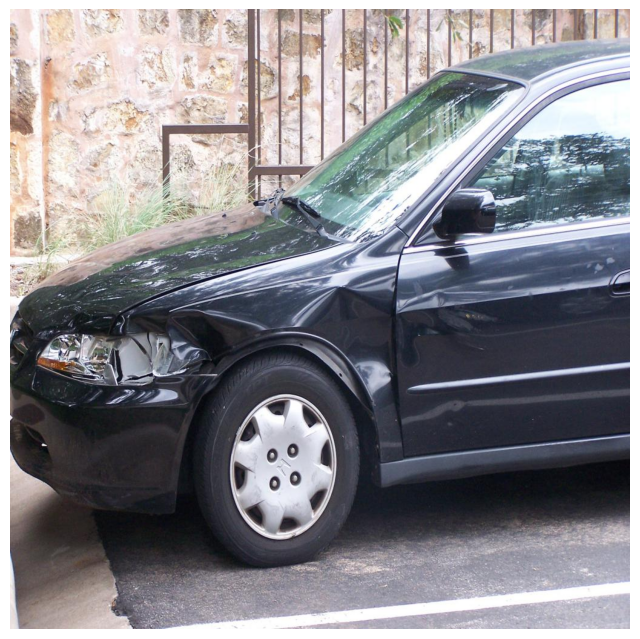

In [20]:
I = io.imread(img_dir + '/' + img['file_name'])
plt.axis('off')
plt.imshow(I)
plt.show()

In [21]:
#get damage annotations
annIds = coco.getAnnIds(imgIds=imgId,iscrowd=None)
anns = coco.loadAnns(annIds)

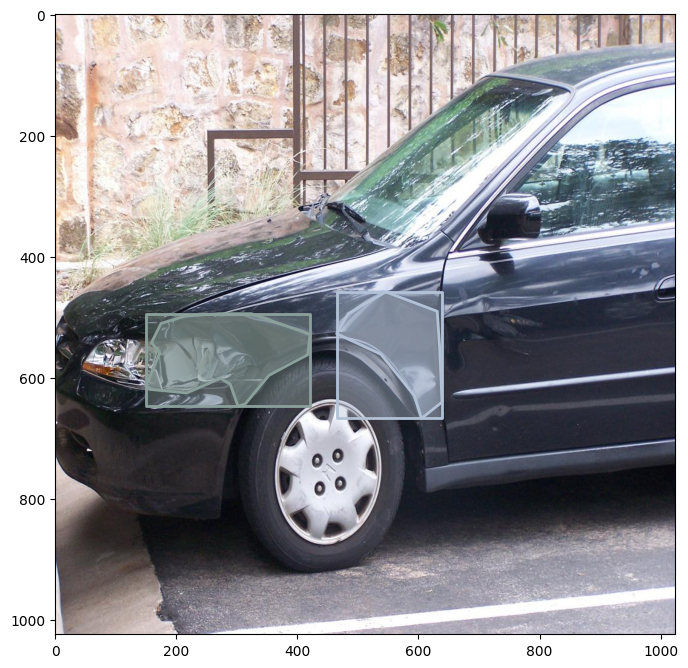

In [22]:
#Plot damages
plt.imshow(I)
plt.axis('on')
coco.showAnns(anns, draw_bbox=True )

In [23]:
#get parts annotations
mul_annIds = mul_coco.getAnnIds(imgIds=imgId,iscrowd=None)
mul_anns = mul_coco.loadAnns(mul_annIds)

In [24]:
# Create a dictionary between category_id and category name
category_map = dict()

for ele in list(mul_coco.cats.values()):
    category_map.update({ele['id']:ele['name']})

In [25]:
category_map

{1: 'headlamp', 2: 'rear_bumper', 3: 'door', 4: 'hood', 5: 'front_bumper'}

Parts are: ['hood', 'door', 'front_bumper', 'headlamp']


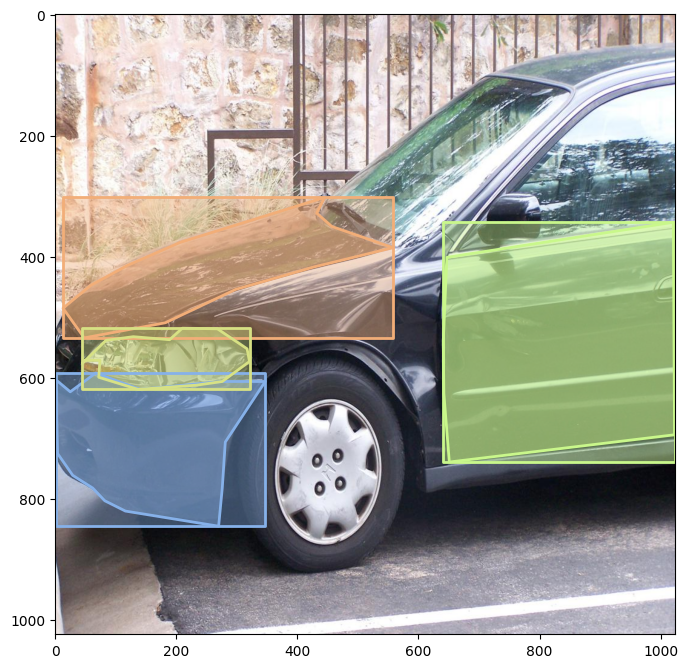

In [26]:
#Create a list of parts in the image
parts = []
for region in mul_anns:
    parts.append(category_map[region['category_id']])

print("Parts are:", parts)

#Plot Parts
I = io.imread(img_dir + '/' + img['file_name'])
plt.imshow(I)
plt.axis('on')
mul_coco.showAnns(mul_anns, draw_bbox=True )

## Training Object detection model using Detectron 2

In [32]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.9 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15549, done.
remote: Counting objects: 100% (274/274), done.
remote: Compressing objects: 100% (212/212), done.
remote: Total 15549 (delta 92), reused 200 (delta 62), pack-reused 15275
Receiving objects: 100% (15549/15549), 6.41 MiB | 23.79 MiB/s, done.
Resolving deltas: 100% (11207/11207), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 8.5 MB/s eta 0:0

In [37]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [38]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
import skimage.io as io

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Set base params
plt.rcParams["figure.figsize"] = [16,9]

In [39]:
dataset_dir = "/content/train"
img_dir = "img/"
train_dir = "train/"
val_dir = "val/"

In [40]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("car_dataset_train", {}, os.path.join(dataset_dir,train_dir,"COCO_train_annos.json"), os.path.join(dataset_dir,img_dir))
register_coco_instances("car_dataset_val", {}, os.path.join(dataset_dir,val_dir,"COCO_val_annos.json"), os.path.join(dataset_dir,img_dir))

In [41]:
dataset_dicts = DatasetCatalog.get("car_dataset_train")
metadata_dicts = MetadataCatalog.get("car_dataset_train")

[04/24 15:54:44 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/train/train/COCO_train_annos.json


## Model Train

In [42]:
#Implementing my own Trainer Module here to use the COCO validation evaluation during training
# TODO: add data custom augmentation
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [50]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("car_dataset_train",)
cfg.DATASETS.TEST = ("car_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 4

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 700
cfg.SOLVER.MAX_ITER = 800 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = []#(600, 800)
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this  dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (damage) + 1
cfg.MODEL.RETINANET.NUM_CLASSES = 2 # only has one class (damage) + 1

cfg.TEST.EVAL_PERIOD = 600

In [51]:
# Clear any logs from previous runs
#TODO add timestamp to logs
!rm -rf cfg.OUTPUT_DIR


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/24 16:08:59 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_f10217.pkl: 178MB [00:01, 155MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[04/24 16:09:01 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/24 16:09:20 d2.utils.events]:  eta: 0:09:34  iter: 19  total_loss: 2.393  loss_cls: 1.085  loss_box_reg: 0.3421  loss_mask: 0.6932  loss_rpn_cls: 0.1883  loss_rpn_loc: 0.0226    time: 0.7145  last_time: 0.7536  data_time: 0.0541  last_data_time: 0.0122   lr: 2.8116e-05  max_mem: 3783M
[04/24 16:09:34 d2.utils.events]:  eta: 0:09:17  iter: 39  total_loss: 2.002  loss_cls: 0.696  loss_box_reg: 0.3533  loss_mask: 0.6831  loss_rpn_cls: 0.262  loss_rpn_loc: 0.02742    time: 0.7172  last_time: 0.7581  data_time: 0.0270  last_data_time: 0.0167   lr: 5.6659e-05  max_mem: 3784M
[04/24 16:09:49 d2.utils.events]:  eta: 0:08:58  iter: 59  total_loss: 1.746  loss_cls: 0.4688  loss_box_reg: 0.4299  loss_mask: 0.6642  loss_rpn_cls: 0.1044  loss_rpn_loc: 0.01817    time: 0.7130  last_time: 0.6690  data_time: 0.0281  last_data_time: 0.0341   lr: 8.5201e-05  max_mem: 3784M
[04/24 16:10:03 d2.utils.events]:  eta: 0:08:41  iter: 79  total_loss: 1.726  loss_cls: 0.4366  loss_box_reg: 0.4705  loss_mask:

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[04/24 16:16:30 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0015 s/iter. Inference: 0.0862 s/iter. Eval: 0.0395 s/iter. Total: 0.1272 s/iter. ETA=0:00:00
[04/24 16:16:30 d2.evaluation.evaluator]: Total inference time: 0:00:00.893428 (0.148905 s / iter per device, on 1 devices)
[04/24 16:16:30 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.086203 s / iter per device, on 1 devices)
[04/24 16:16:30 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/24 16:16:30 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[04/24 16:16:30 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[04/24 16:19:02 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0011 s/iter. Inference: 0.0851 s/iter. Eval: 0.0339 s/iter. Total: 0.1201 s/iter. ETA=0:00:00
[04/24 16:19:02 d2.evaluation.evaluator]: Total inference time: 0:00:00.814015 (0.135669 s / iter per device, on 1 devices)
[04/24 16:19:02 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.085057 s / iter per device, on 1 devices)
[04/24 16:19:02 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/24 16:19:02 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[04/24 16:19:02 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

## Model Metrics and Hyper Parameters Visualization

In [89]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir ./output

Reusing TensorBoard on port 6007 (pid 22796), started 0:01:54 ago. (Use '!kill 22796' to kill it.)

<IPython.core.display.Javascript object>

## Model Evaluation

In [74]:
evaluator = COCOEvaluator("car_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "car_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[04/24 16:30:22 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/24 16:30:22 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[04/24 16:30:22 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/train/val/COCO_val_annos.json
[04/24 16:30:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[04/24 16:30:22 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[04/24 16:30:22 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[04/24 16:30:22 d2.data.common]: Serialized dataset takes 0.01 MiB
[04/24 16:30:22 d2.evaluation.evaluator]: Start inference on 11 batches


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[04/24 16:30:26 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0015 s/iter. Inference: 0.0976 s/iter. Eval: 0.0446 s/iter. Total: 0.1437 s/iter. ETA=0:00:00
[04/24 16:30:26 d2.evaluation.evaluator]: Total inference time: 0:00:00.962971 (0.160495 s / iter per device, on 1 devices)
[04/24 16:30:26 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.097605 s / iter per device, on 1 devices)
[04/24 16:30:26 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/24 16:30:26 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/24 16:30:26 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0

## Model Inference

Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:

In [75]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("car_dataset_val", )
predictor = DefaultPredictor(cfg)

[04/24 16:30:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [76]:
val_dataset_dicts = DatasetCatalog.get("car_dataset_val")
val_metadata_dicts = MetadataCatalog.get("car_dataset_val")

[04/24 16:30:56 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/train/val/COCO_val_annos.json


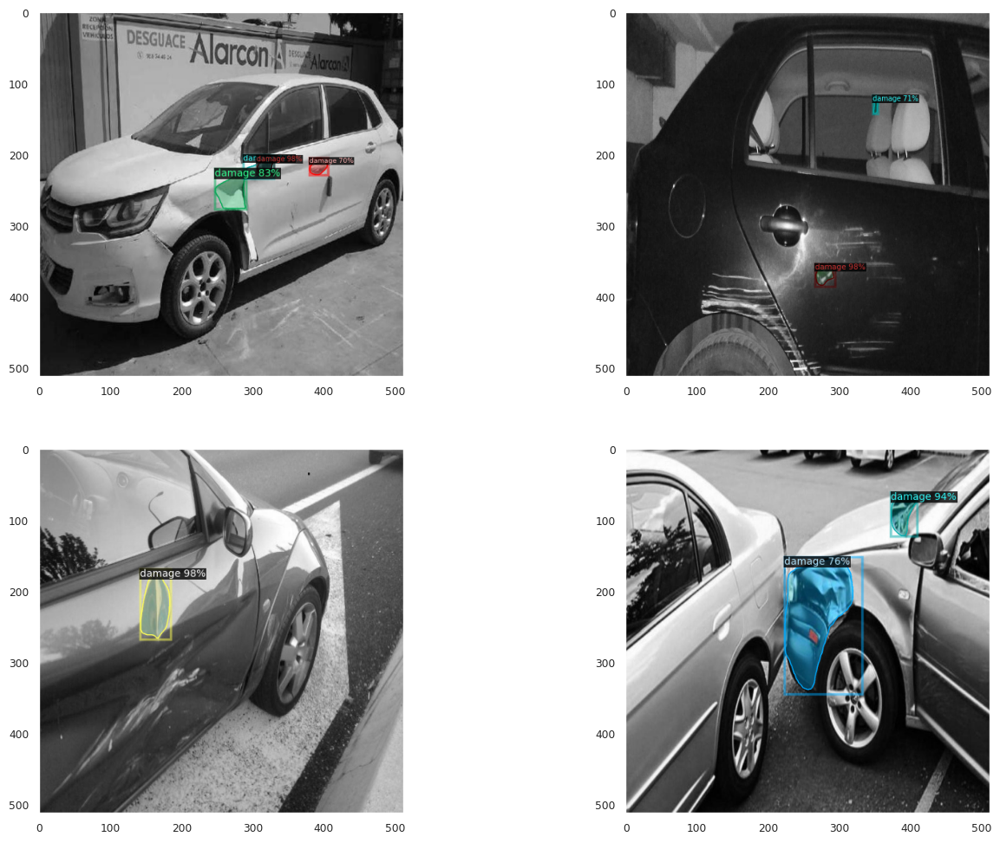

In [77]:
fig, ax = plt.subplots(2, 2, figsize =(16,12))
indices=[ax[0][0],ax[1][0],ax[0][1],ax[1][1] ]
i=-1
for d in random.sample(val_dataset_dicts, 4):
    i=i+1
    im = io.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata_dicts,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    indices[i].grid(False)
    indices[i].imshow(out.get_image()[:, :, ::-1])

## Other models (model zoo detectron2)

https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md

* Faster R-CNN (variantes de image net)
* RetinaNet
* RPN & Fast R-CNN
* Mask R-CNN